In [1]:
# carregar bibliotecas
import pandas as pd
import numpy
import matplotlib.pyplot as plt
import seaborn as sn
import numpy as np
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.stattools as ts
import statsmodels.regression.linear_model as rg
import arch.unitroot as at
from statsmodels.tsa.stattools import adfuller
from mlpairs import OpticsPairs

In [2]:
#path = 'C:/Users/vinicius_coin/Desktop/DADOS_MESTRADO/bovesparser-master/data/RESULTSET/'
path = 'C:/Users/vinicius_coin/Desktop/DADOS_MESTRADO/bovesparser-master/data/PREBASE/'
dfbovespa = pd.read_csv(path+"COTACOES_consolidado.csv", sep = ';',encoding="ISO-8859-1")
ibovespa = pd.read_csv("C:/Users/vinicius_coin/Desktop/DADOS_MESTRADO/bovesparser-master/data/APOIO/ibovespa.csv", sep = ',',encoding="ISO-8859-1",usecols = ["Date","Close"])
ibovespa["Date"] = pd.to_datetime(ibovespa["Date"])
lista_papeis = dfbovespa.cod_papel.unique()

In [3]:
#Pega a data da contacao da petrobras e torna index
df_comp = pd.DataFrame()
df_acao = dfbovespa[dfbovespa["cod_papel"] == 'PETR3']
df_comp['data_pregao'] =  pd.to_datetime(df_acao['data_pregao'].values)
len(df_acao)

2472

In [4]:
for papel in lista_papeis:
    #if papel[-1] in ['3', '4']:
    if papel[-1] not in ['F']:
        df_acao = dfbovespa[dfbovespa["cod_papel"] == papel]
        if len(df_acao) == 2472:
            df_comp[papel] = df_acao['preco_ultimo'].values
df_comp.set_index('data_pregao', inplace=True)
df_comp = df_comp['2017-06-30':'2019-06-30']
df_comp.head()

,ABCB4,ALPA4,BBAS3,BBDC3,BBDC4,BBRK3,BEEF3,BRAP4,BRFS3,BRML3,...,SULA11,TCSA3,TGMA3,TOTS3,TRPL4,UNIP6,USIM3,USIM5,VALE3,WEGE3
data_pregao,,,,,,,,,,,,,,,,,,,,,
2017-06-30,16.79,13.71,26.80,27.60,28.15,1.16,12.31,20.60,39.20,11.95,...,17.70,2.05,13.80,30.16,64.50,9.98,8.83,4.60,29.00,17.70
2017-07-03,16.10,13.90,27.17,27.70,28.20,1.16,12.39,21.09,39.37,12.01,...,18.10,2.08,13.80,30.02,64.35,9.76,9.00,4.70,29.65,17.95
2017-07-04,15.88,13.91,27.31,27.66,28.22,1.16,12.45,21.18,39.16,12.03,...,18.33,2.11,13.84,30.46,64.30,9.60,9.05,4.67,29.62,18.02
2017-07-05,15.82,13.75,27.17,27.72,28.23,1.16,12.34,20.76,39.08,12.05,...,18.07,2.11,13.79,30.06,64.60,9.19,9.21,4.74,28.93,18.11
2017-07-06,15.85,13.75,26.99,27.17,27.82,1.15,12.56,20.95,37.86,11.74,...,17.77,2.10,13.76,29.74,66.55,9.58,9.60,4.84,28.92,17.72


In [5]:
train = df_comp[:'2018']
test = df_comp['2019':]

In [6]:
op = OpticsPairs(train)
op.returns.head()

,ABCB4,ALPA4,BBAS3,BBDC3,BBDC4,BBRK3,BEEF3,BRAP4,BRFS3,BRML3,...,SULA11,TCSA3,TGMA3,TOTS3,TRPL4,UNIP6,USIM3,USIM5,VALE3,WEGE3
data_pregao,,,,,,,,,,,,,,,,,,,,,
2017-07-03,-0.041096,0.013858,0.013806,0.003623,0.001776,0.000000,0.006499,0.023786,0.004337,0.005021,...,0.022599,0.014634,0.000000,-0.004642,-0.002326,-0.022044,0.019253,0.021739,0.022414,0.014124
2017-07-04,-0.013665,0.000719,0.005153,-0.001444,0.000709,0.000000,0.004843,0.004267,-0.005334,0.001665,...,0.012707,0.014423,0.002899,0.014657,-0.000777,-0.016393,0.005556,-0.006383,-0.001012,0.003900
2017-07-05,-0.003778,-0.011503,-0.005126,0.002169,0.000354,0.000000,-0.008835,-0.019830,-0.002043,0.001663,...,-0.014184,0.000000,-0.003613,-0.013132,0.004666,-0.042708,0.017680,0.014989,-0.023295,0.004994
2017-07-06,0.001896,0.000000,-0.006625,-0.019841,-0.014524,-0.008621,0.017828,0.009152,-0.031218,-0.025726,...,-0.016602,-0.004739,-0.002175,-0.010645,0.030186,0.042437,0.042345,0.021097,-0.000346,-0.021535
2017-07-07,-0.018927,0.015273,-0.013338,0.004049,0.001078,0.008696,-0.000796,-0.005251,-0.011622,0.017888,...,-0.005065,0.014286,-0.011628,-0.023874,0.012622,0.033403,0.030208,0.002066,-0.001037,0.013544


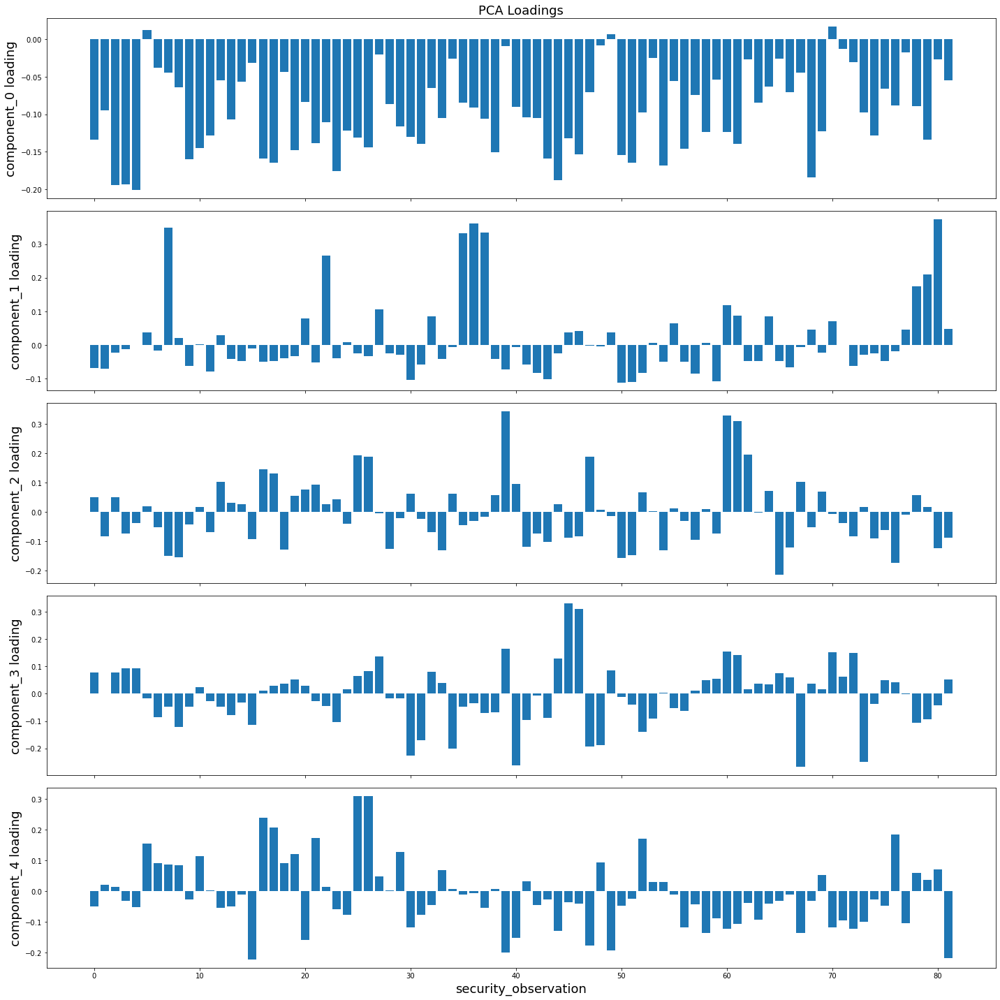

In [7]:
op.reduce_PCA()
op.plot_loadings()

Total variance explained: 75.29%


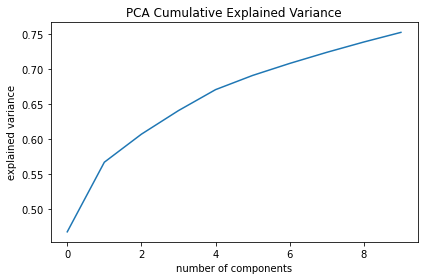

In [8]:
op.plot_explained_variance()
total_variance_explained = np.cumsum(op.explained_variance_ratio_)[-1]
print(f"Total variance explained: {round(total_variance_explained, 4)*100}%")

In [9]:
# Gerar clusters e encontrar potenciais pares  
op.find_pairs()
op.pairs

Found 1953 potential pairs


0       (ABCB4, ALPA4)
1       (ABCB4, BBAS3)
2       (ABCB4, BBDC3)
3       (ABCB4, BBDC4)
4       (ABCB4, BEEF3)
             ...      
1948    (UNIP6, USIM5)
1949    (UNIP6, VALE3)
1950    (USIM3, USIM5)
1951    (USIM3, VALE3)
1952    (USIM5, VALE3)
Length: 1953, dtype: object

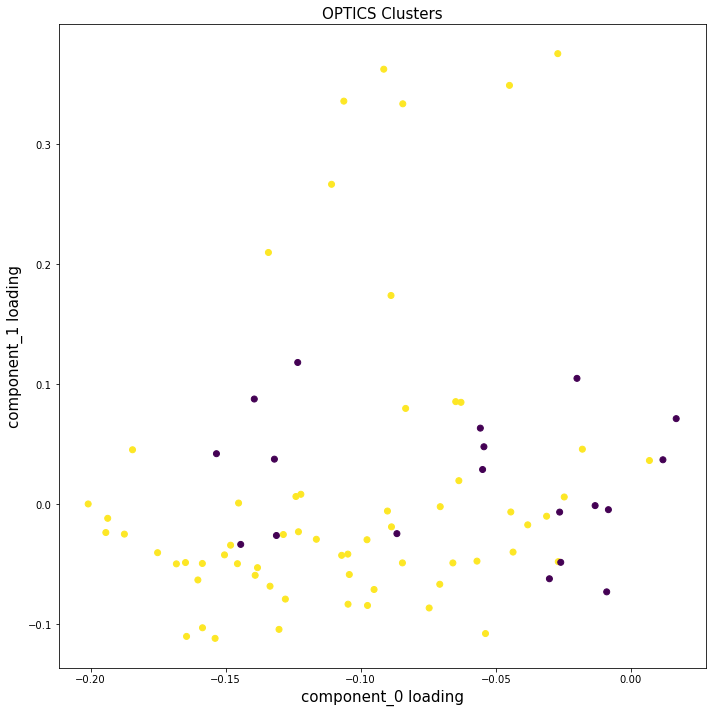

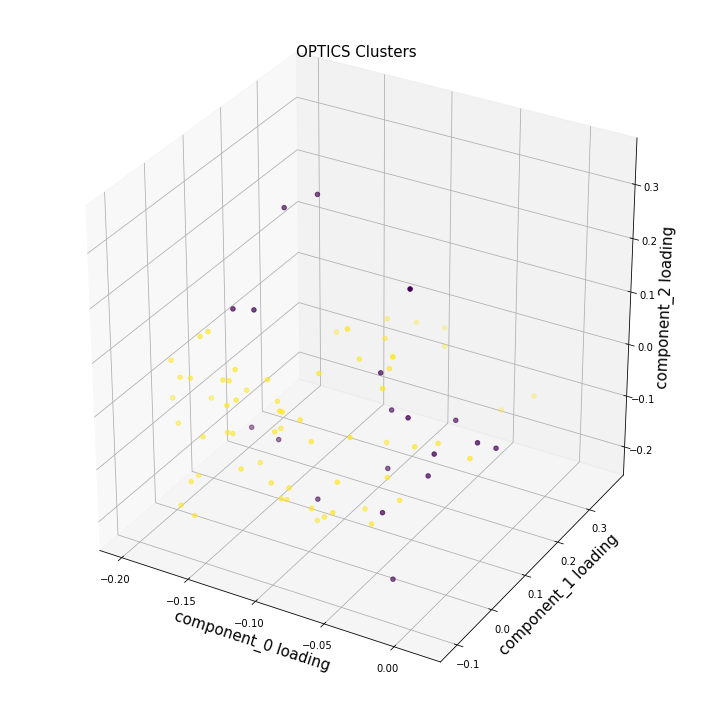

In [10]:
# Plot clusters encontrados
op.plot_clusters(n_dimensions=2)
op.plot_clusters(n_dimensions=3)

In [11]:
# Calcular potenciais pares
op.calc_eg_norm_spreads()
op.calc_hurst_exponents()
op.calc_half_lives()
op.calc_avg_cross_count()

In [12]:
# filtrar potenciais pares
op.filter_pairs()
op.filtered_pairs

Found 67 tradable pairs!


,pair,pvalue,hurst_exp,half_life,avg_cross_count
2,"(ABCB4, BBDC3)",0.007931,0.311072,9.558007,26.634146
48,"(ABCB4, POMO4)",0.035969,0.415738,20.415914,15.707317
95,"(ALPA4, IGTA3)",0.020160,0.197261,7.724987,28.000000
109,"(ALPA4, POMO4)",0.040481,0.441613,28.829675,12.292683
203,"(BBDC3, EVEN3)",0.040244,0.265117,11.549640,22.536585
...,...,...,...,...,...
1928,"(TCSA3, UNIP6)",0.003525,0.136115,8.645736,18.439024
1931,"(TCSA3, VALE3)",0.011565,0.164709,11.387392,22.536585
1942,"(TOTS3, VALE3)",0.021066,0.183665,13.381143,22.536585
1949,"(UNIP6, VALE3)",0.010051,0.218804,10.441175,23.902439


C:\Users\vinicius_coin\mlpairs.py:341: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(2, 1, sharex=True, figsize=(20, 10))


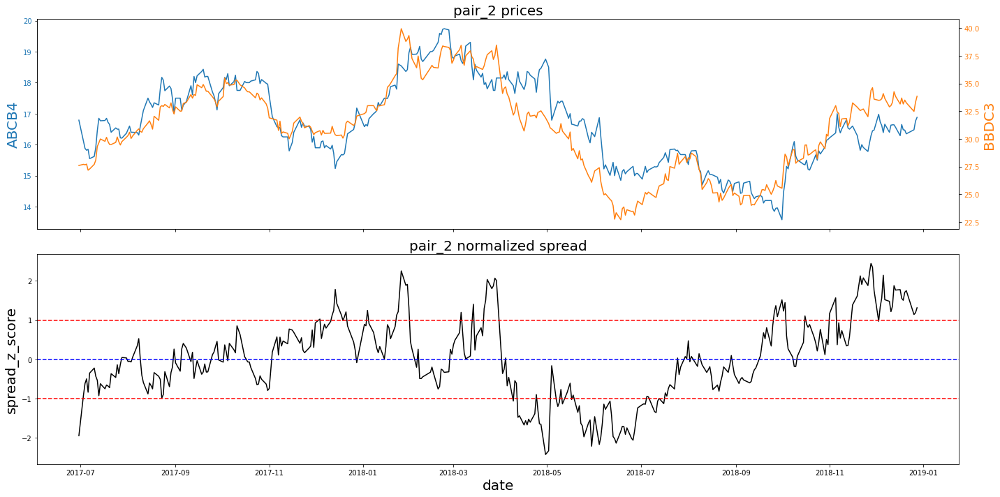

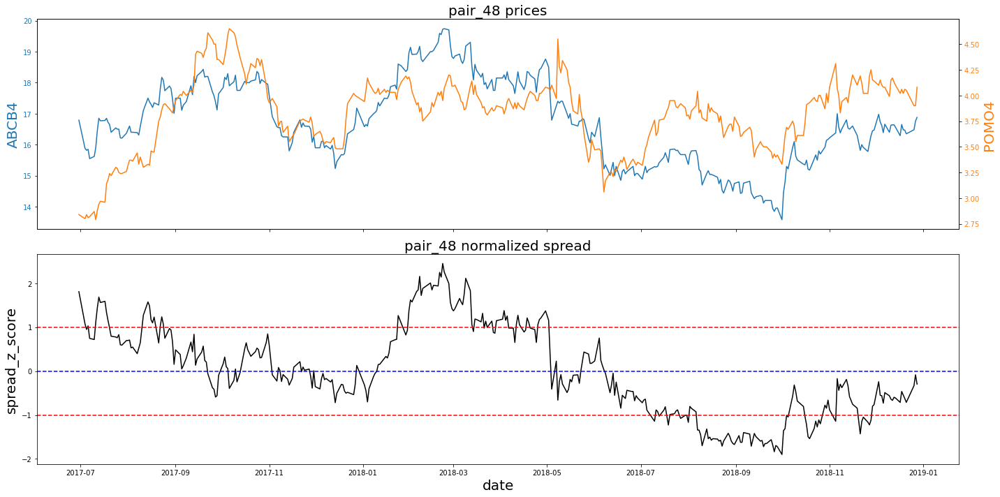

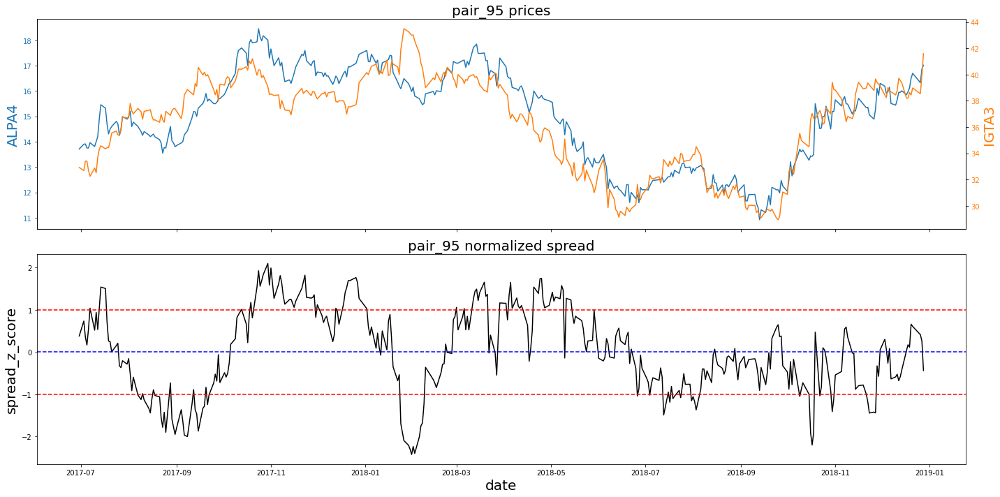

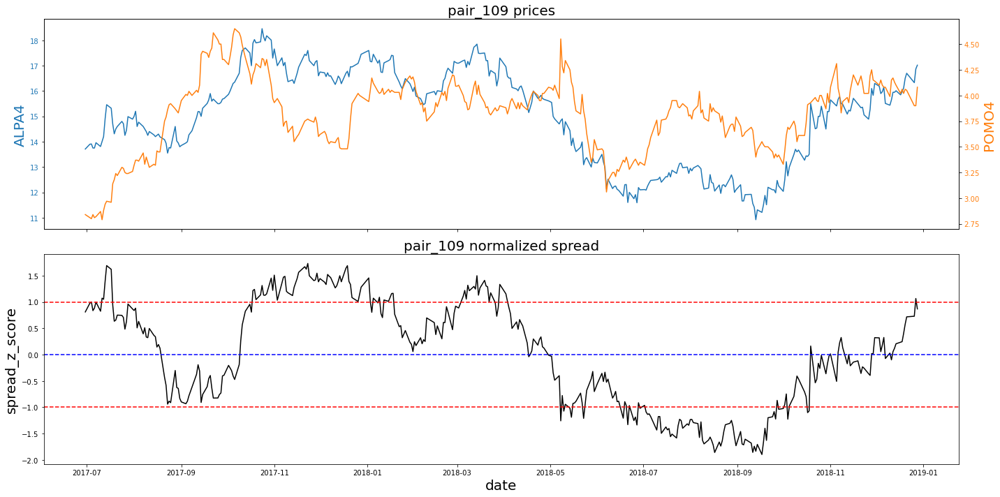

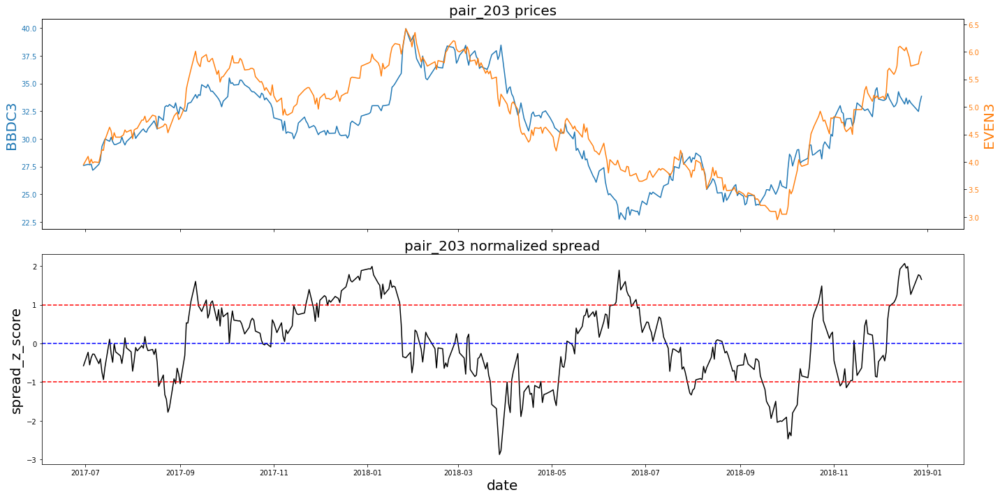

...

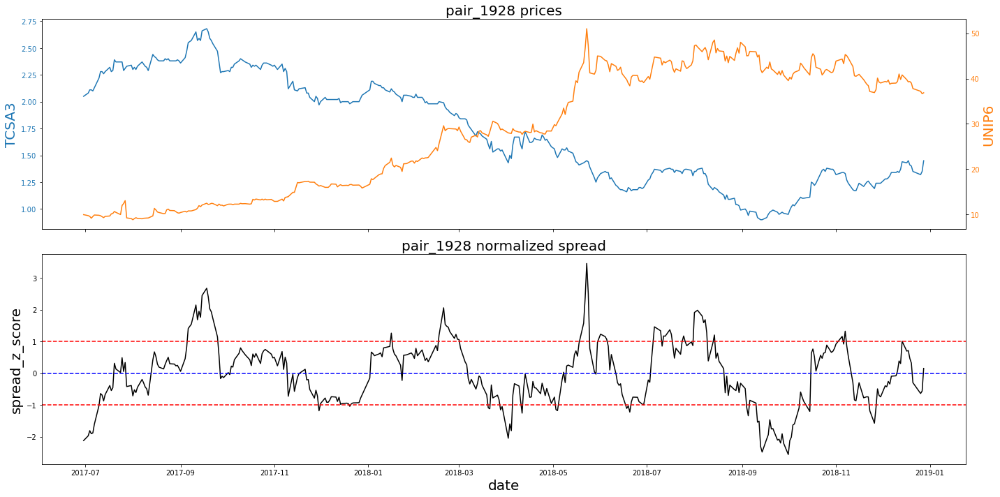

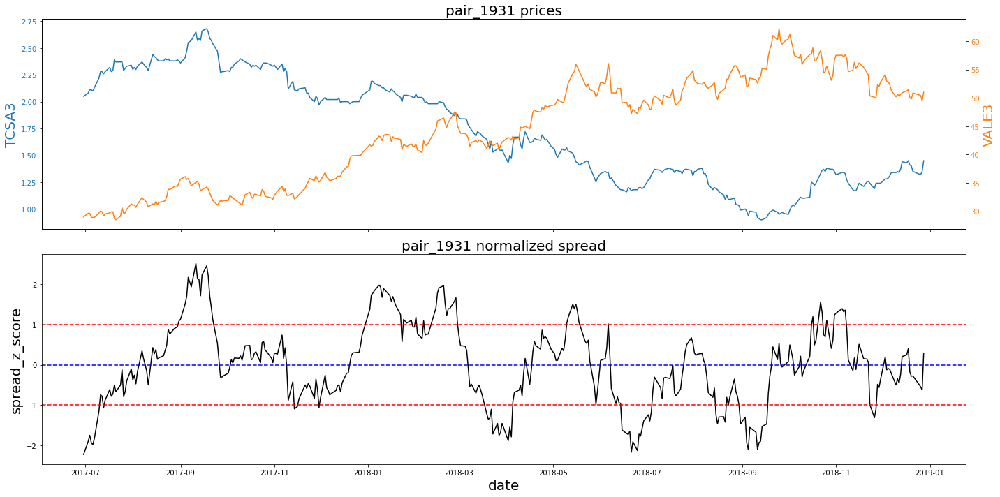

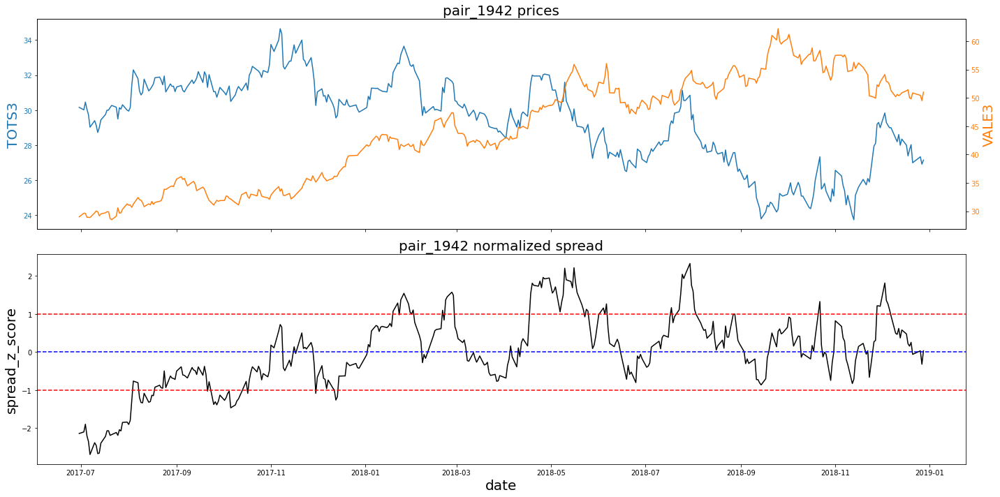

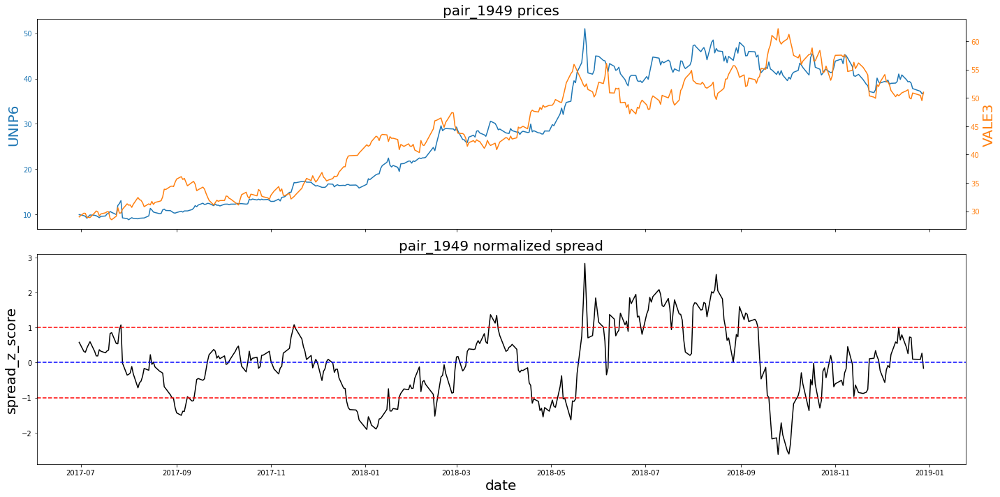

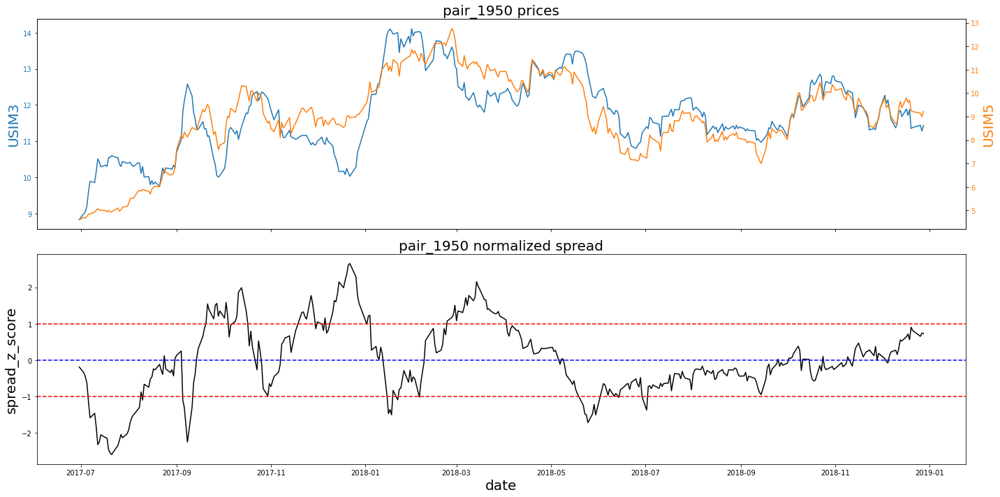

In [13]:
for i in op.filtered_pairs.index:
    op.plot_pair_price_spread(idx=i)